In [76]:
import cv2
from keras.layers import Conv2D
import pickle

SIZE = 256

def rf_img_load(path):
    img = cv2.imread(path, cv2.IMREAD_COLOR)       
    img = cv2.resize(img, (SIZE, SIZE))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    return img

def rf_mask_load(path):
    mask = cv2.imread(path, 0)       
    mask = cv2.resize(mask, (SIZE, SIZE))
    return mask

def get_feature_extractor(path):
    activation = 'sigmoid'
    feature_extractor = Sequential()
    feature_extractor.add(Conv2D(32, 3, activation = activation, padding = 'same', input_shape = (SIZE, SIZE, 3)))
    feature_extractor.add(Conv2D(32, 3, activation = activation, padding = 'same', kernel_initializer = 'he_uniform'))
    feature_extractor.load_weights(path)
    return feature_extractor

def get_model(path):
    model = pickle.load(open(path, 'rb'))
    return model

from keras.models import Sequential

FE = get_feature_extractor("models/RF/FE_1.sav")
RF = get_model("RF_model.sav")
mask_example = rf_mask_load('segm_data/Tile 8/masks/image_part_001.png')

def segment_img(test_img, model, FE):
    test_img = np.expand_dims(test_img, axis=0)
    X_test_feature = FE.predict(test_img)
    X_test_feature = X_test_feature.reshape(-1, X_test_feature.shape[3])
    _1, x, y, _ = test_img.shape

    prediction = model.predict(X_test_feature) 
    prediction_image = prediction.reshape((x, y, 1))
    return prediction_image

In [85]:
import numpy as np

large_image = cv2.imread('ZapUkr_2023_08_31_36738247_47575448_37061005_47803009.tiff')
tile_size = (256, 256)
overlap = 50 

segmentation_map = np.zeros_like(large_image)

In [33]:
from typing import Any, Optional, Tuple
import matplotlib.pyplot as plt

def plot_image(
    image: np.ndarray, factor: float = 1.0, clip_range: Optional[Tuple[float, float]] = None, **kwargs: Any
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

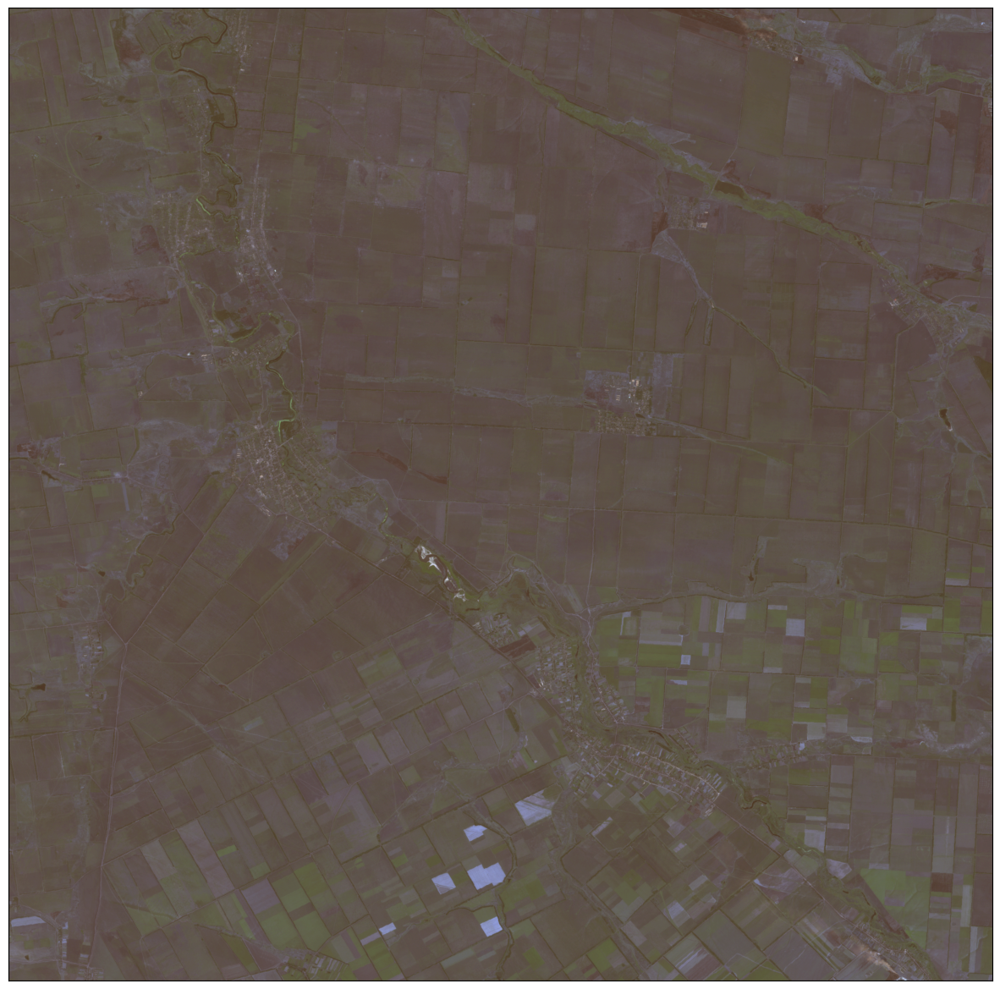

In [86]:
plot_image(large_image, factor=3.5 / 255, clip_range=(0, 1))

In [34]:
def show_diff(tile, num):
    image = rf_img_load(f'segm_data/Tile {tile}/images/image_part_00{num}.jpg')
    mask = rf_mask_load(f'segm_data/Tile {tile}/masks/image_part_00{num}.png')
            tile = np.expand_dims(tile, axis=0)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
    ax[0].imshow(image)
    ax[1].imshow(segment_img(image, RF, FE))
    ax[2].imshow(mask)
    plt.show()

1/1 [==============================] - 0s 28ms/step


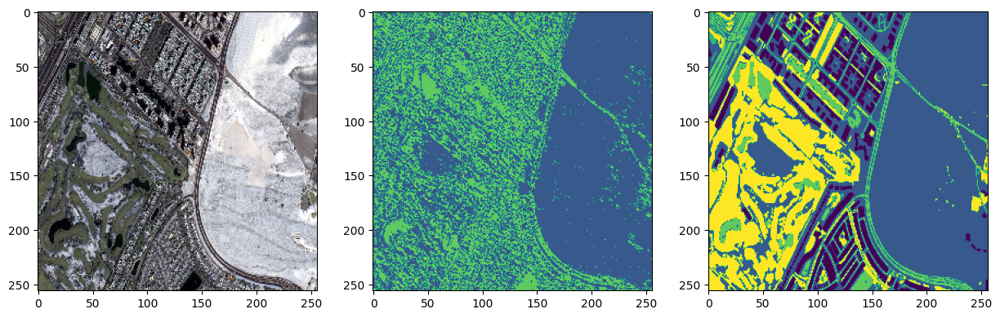

In [63]:
image = rf_img_load('segm_data/Tile 8/images/image_part_001.jpg')
mask = rf_mask_load('segm_data/Tile 8/masks/image_part_001.png')
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
ax[0].imshow(image)
ax[1].imshow(segment_img(image, RF, FE))
ax[2].imshow(mask)

1/1 [==============================] - 0s 15ms/step


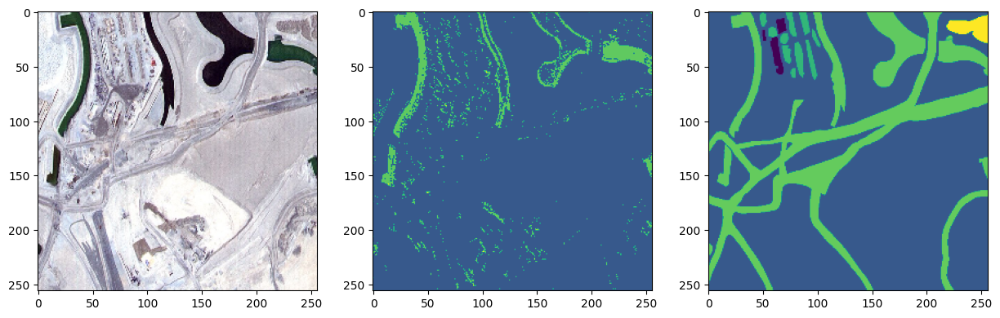

1/1 [==============================] - 0s 15ms/step


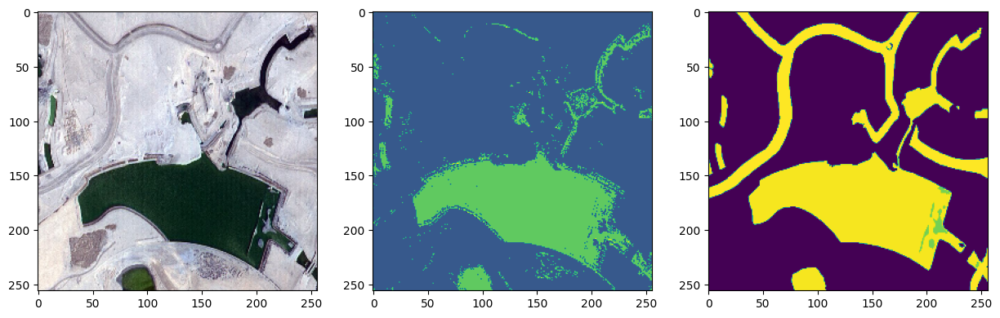

1/1 [==============================] - 0s 15ms/step


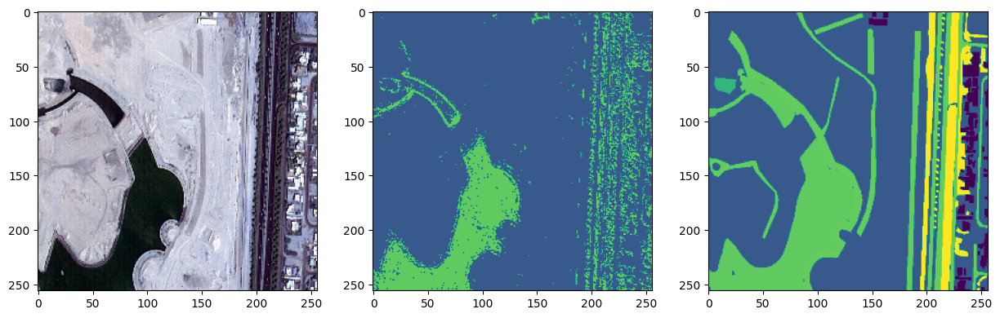

1/1 [==============================] - 0s 14ms/step


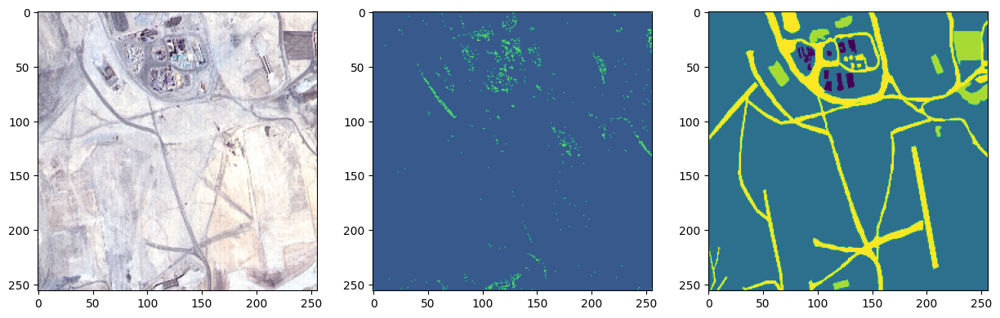

1/1 [==============================] - 0s 15ms/step


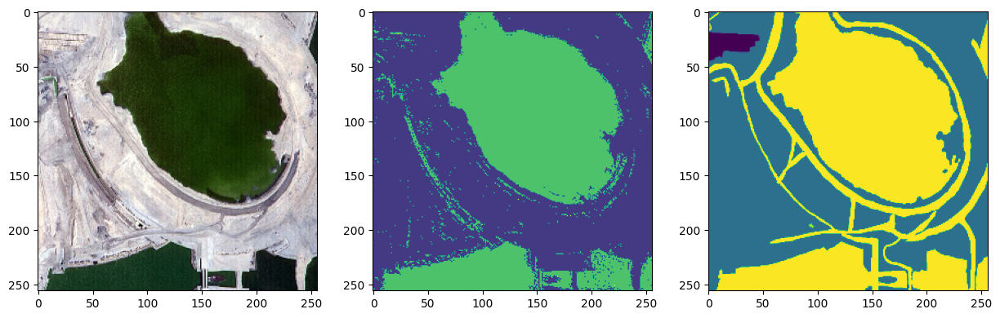

1/1 [==============================] - 0s 15ms/step


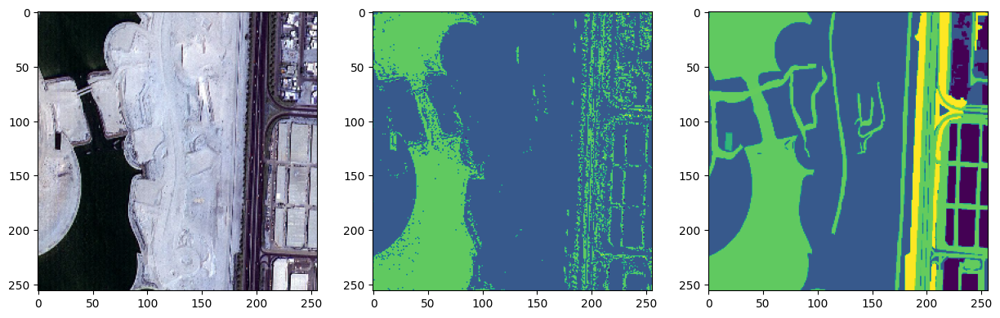

1/1 [==============================] - 0s 15ms/step


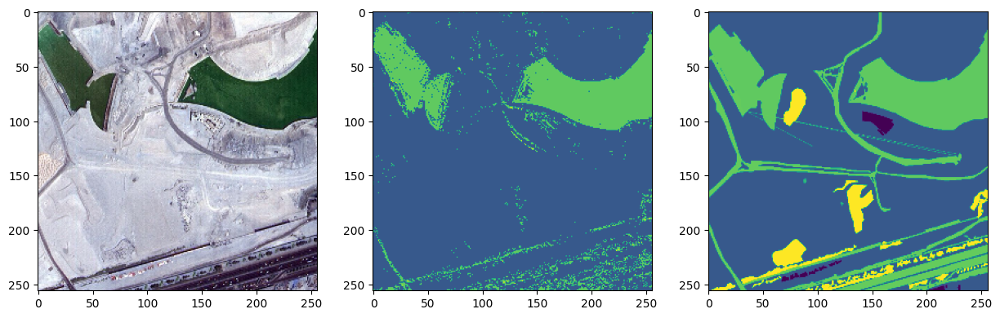

1/1 [==============================] - 0s 14ms/step


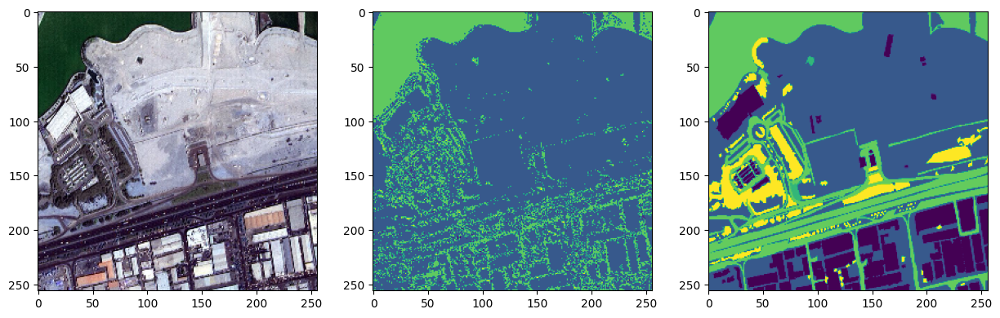

In [36]:
for i in range(1, 9):
    show_diff(1, i)

1/1 [==============================] - 0s 15ms/step


/tmp/ipykernel_10618/2390775863.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))


1/1 [==============================] - 0s 14ms/step


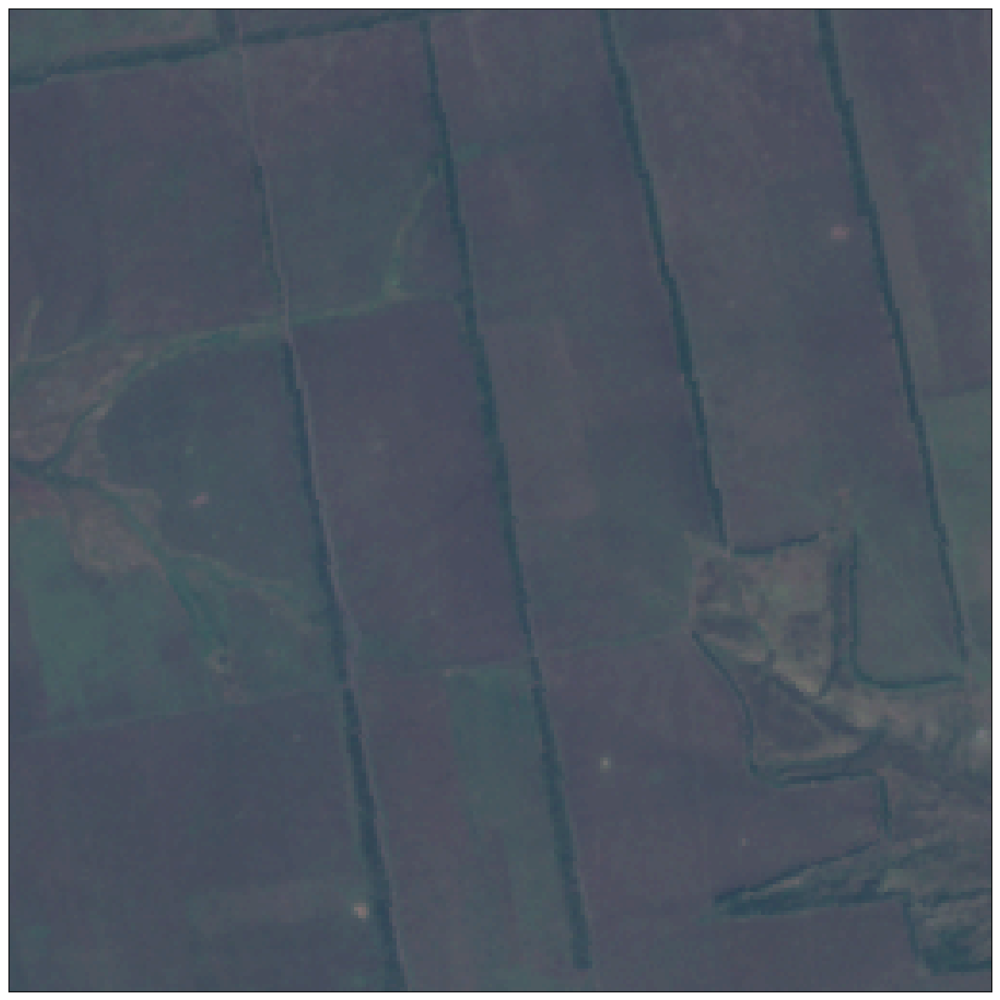

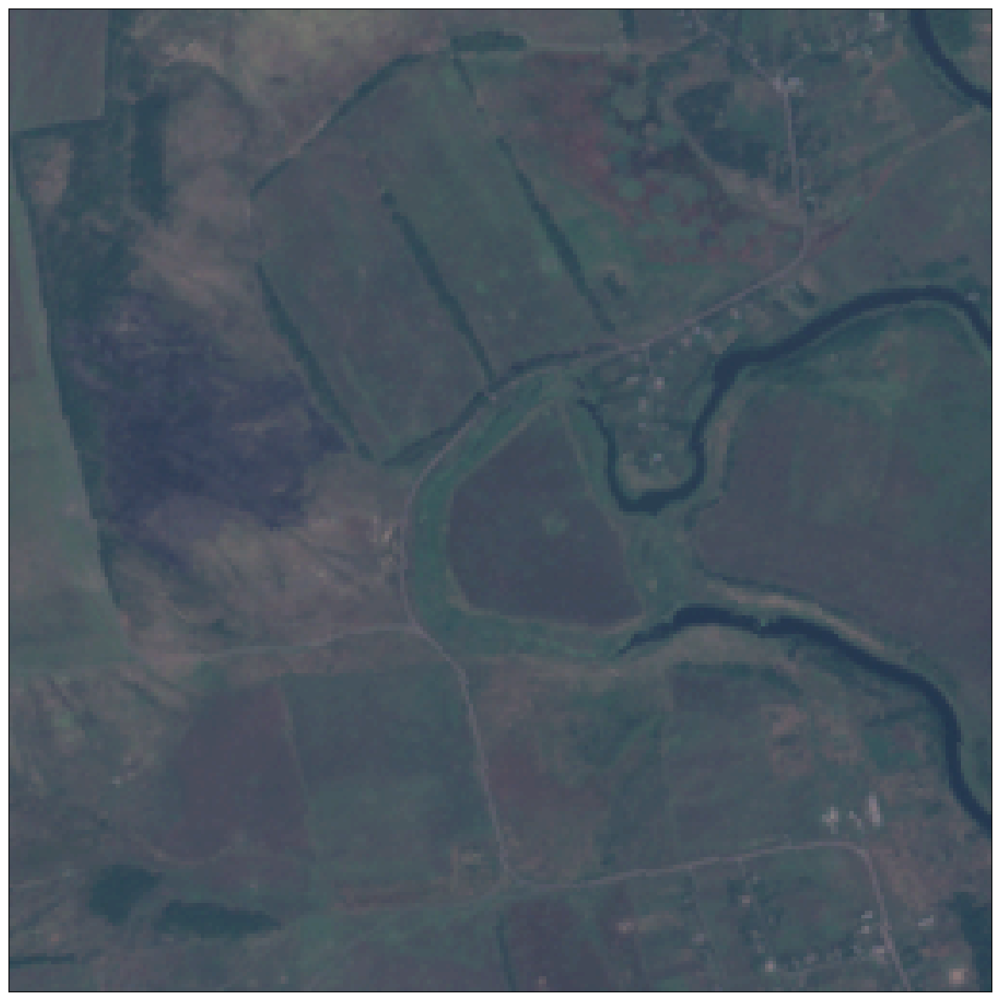

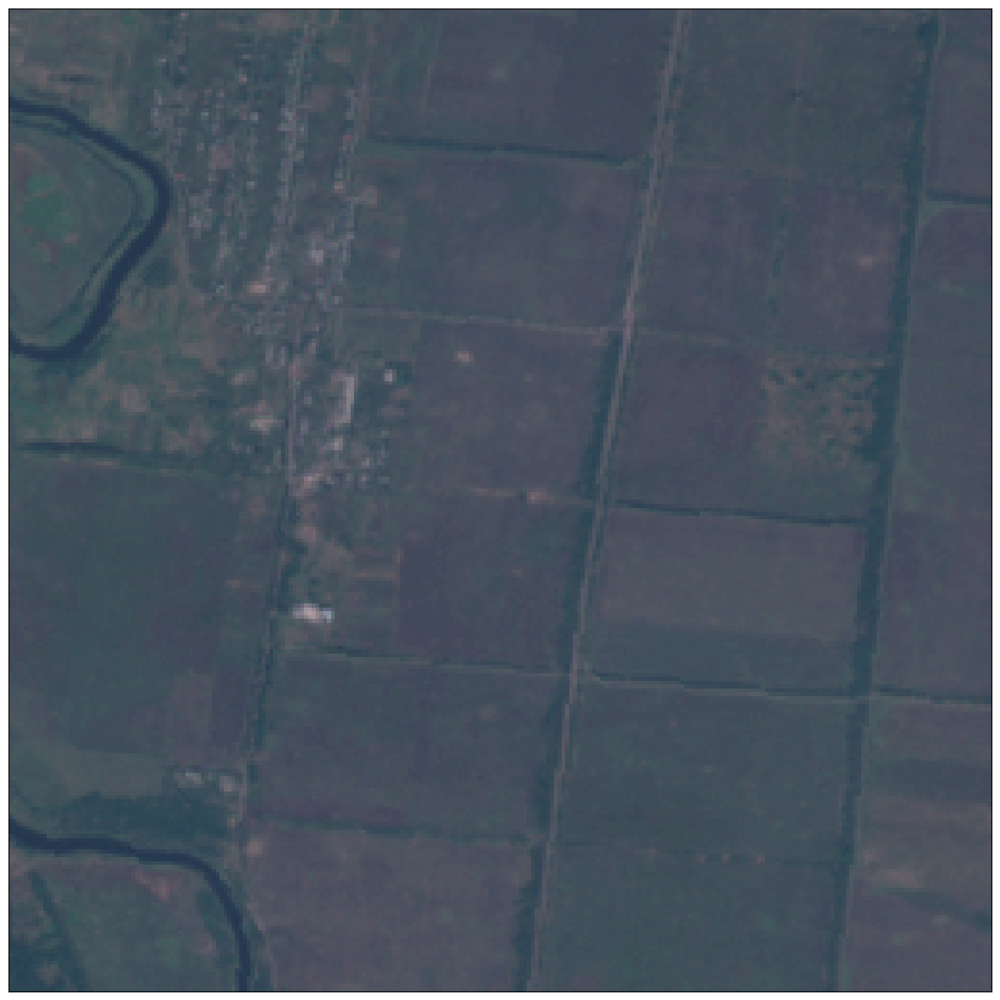

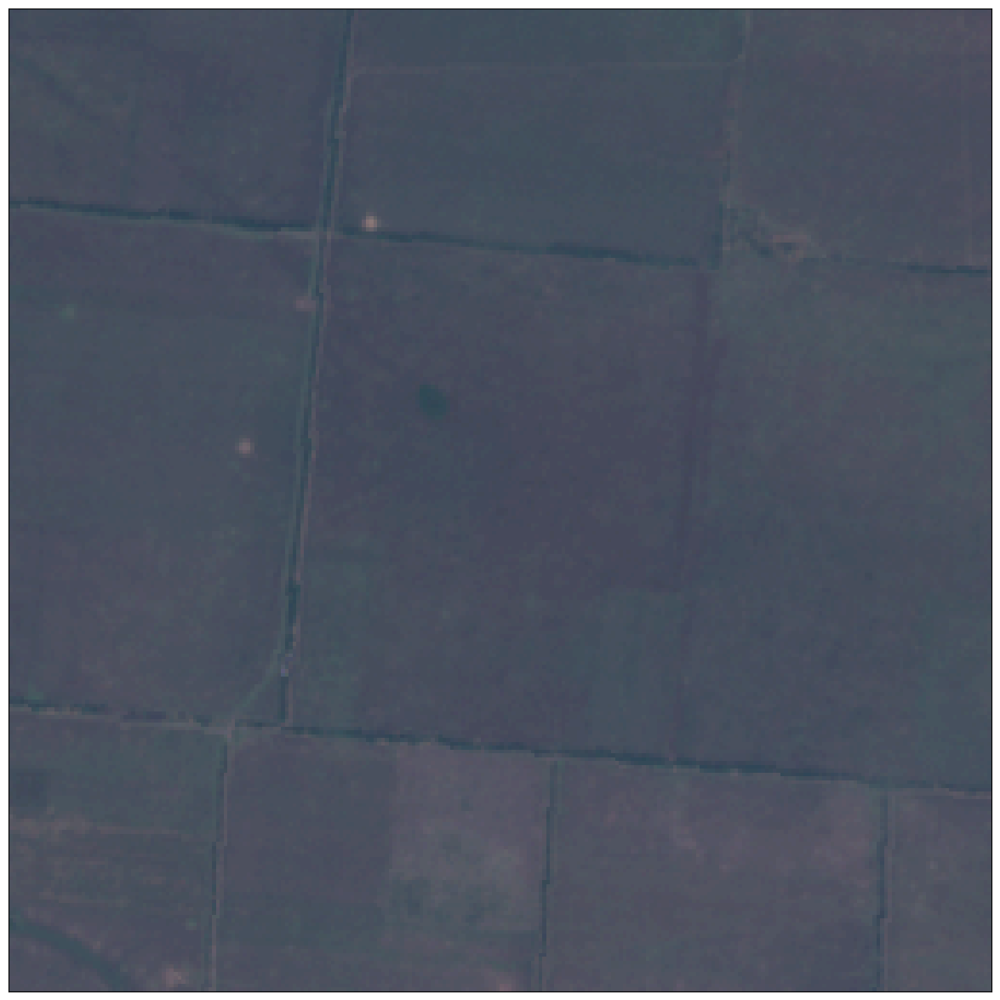

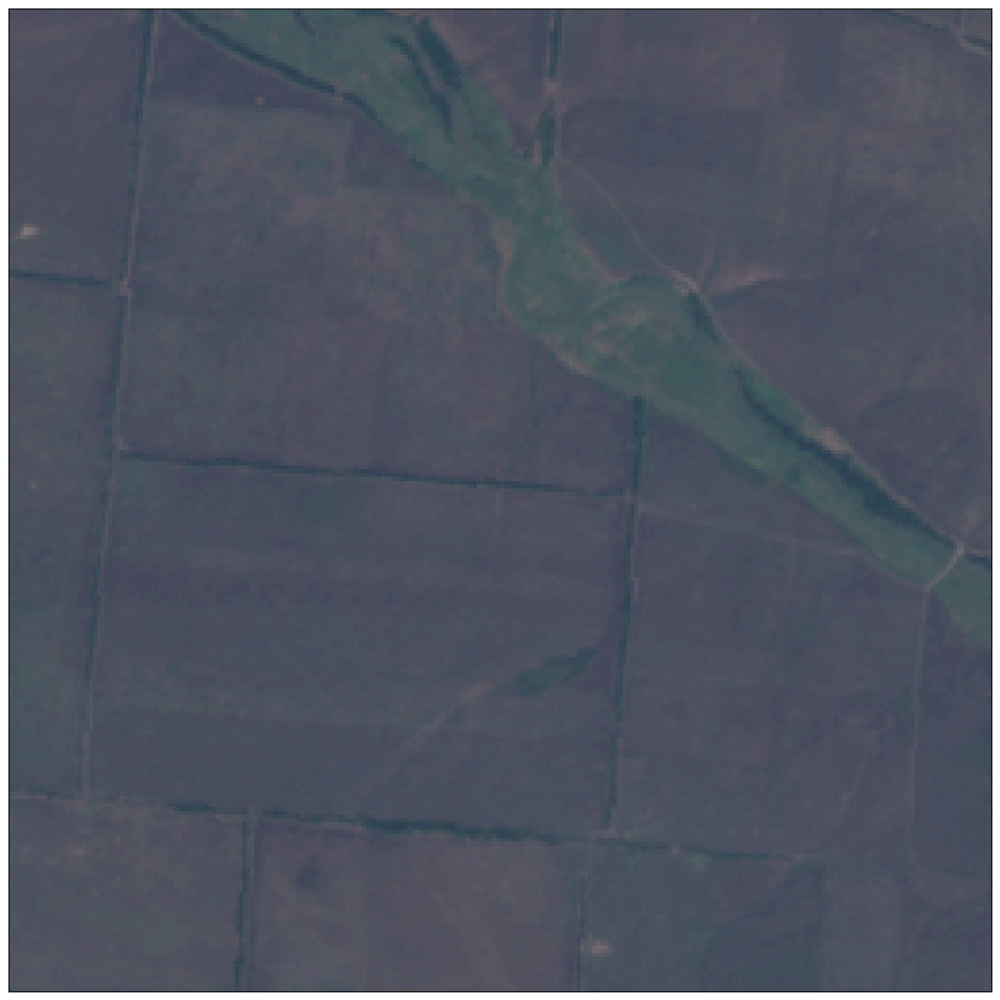

...

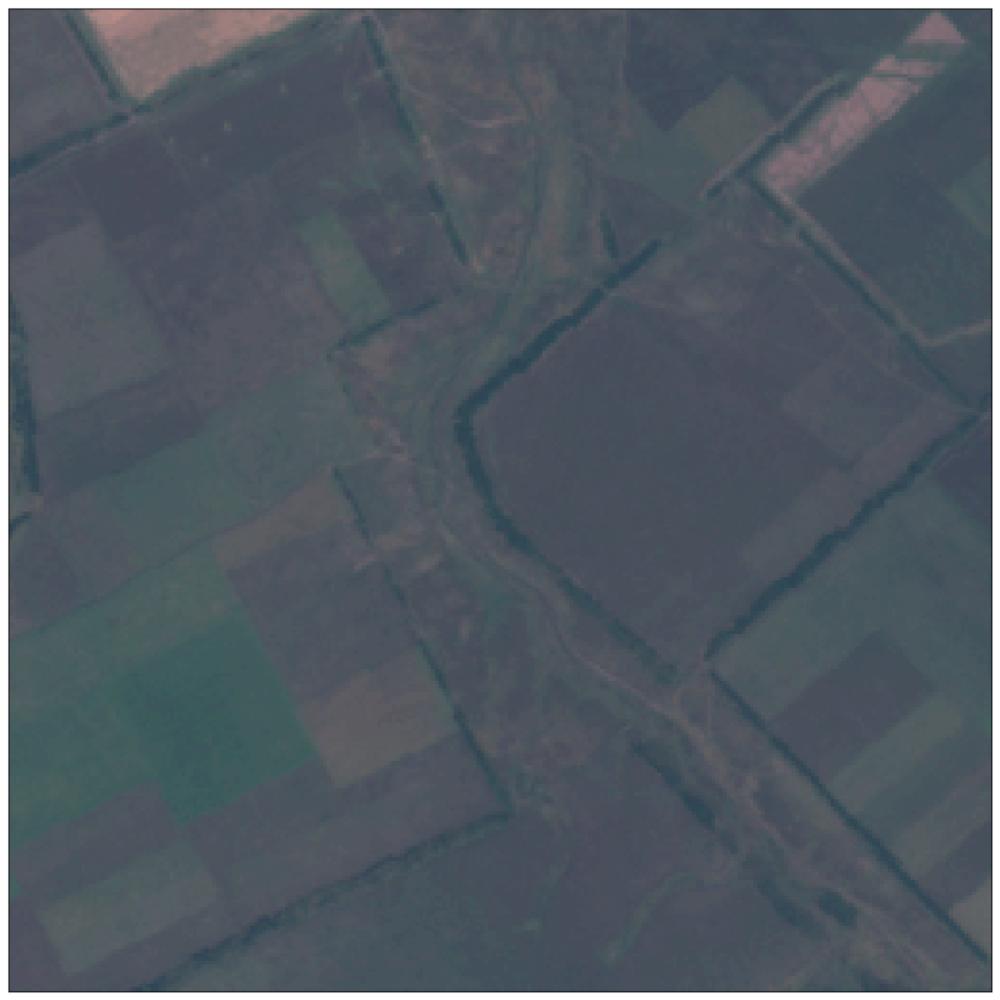

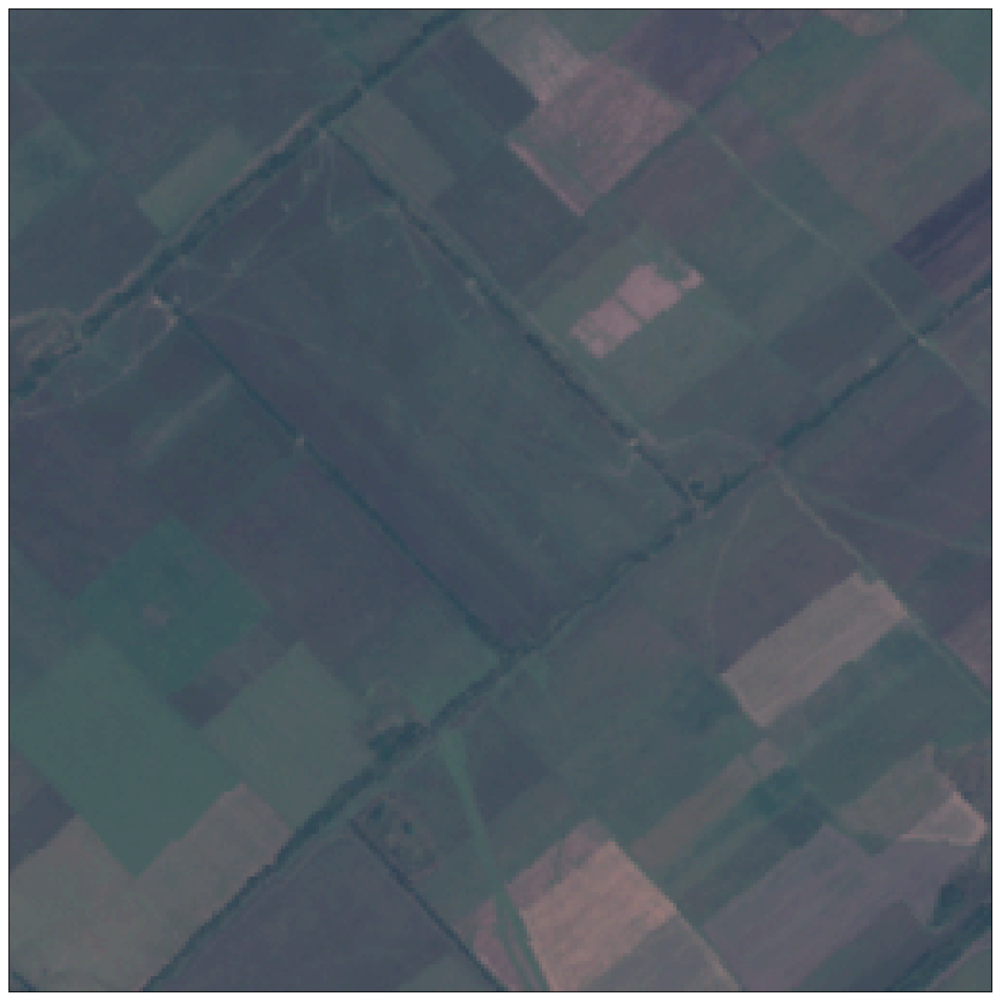

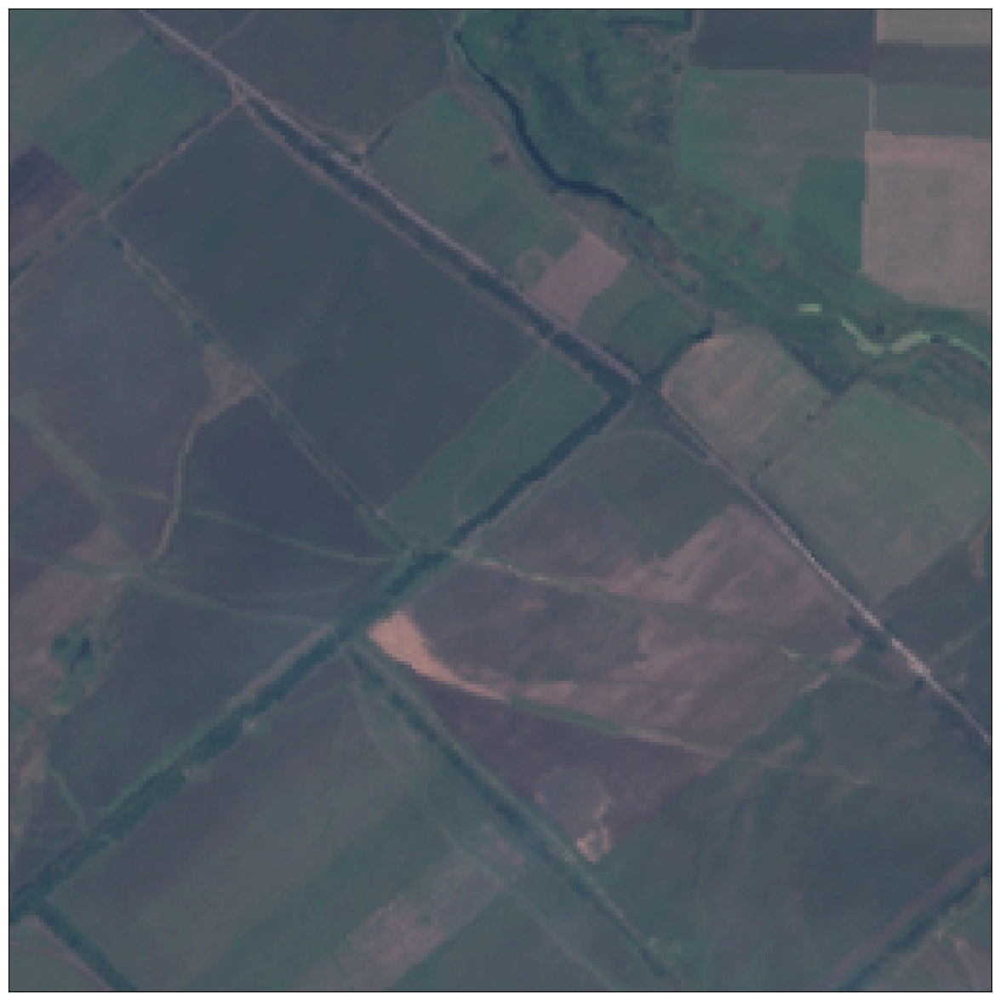

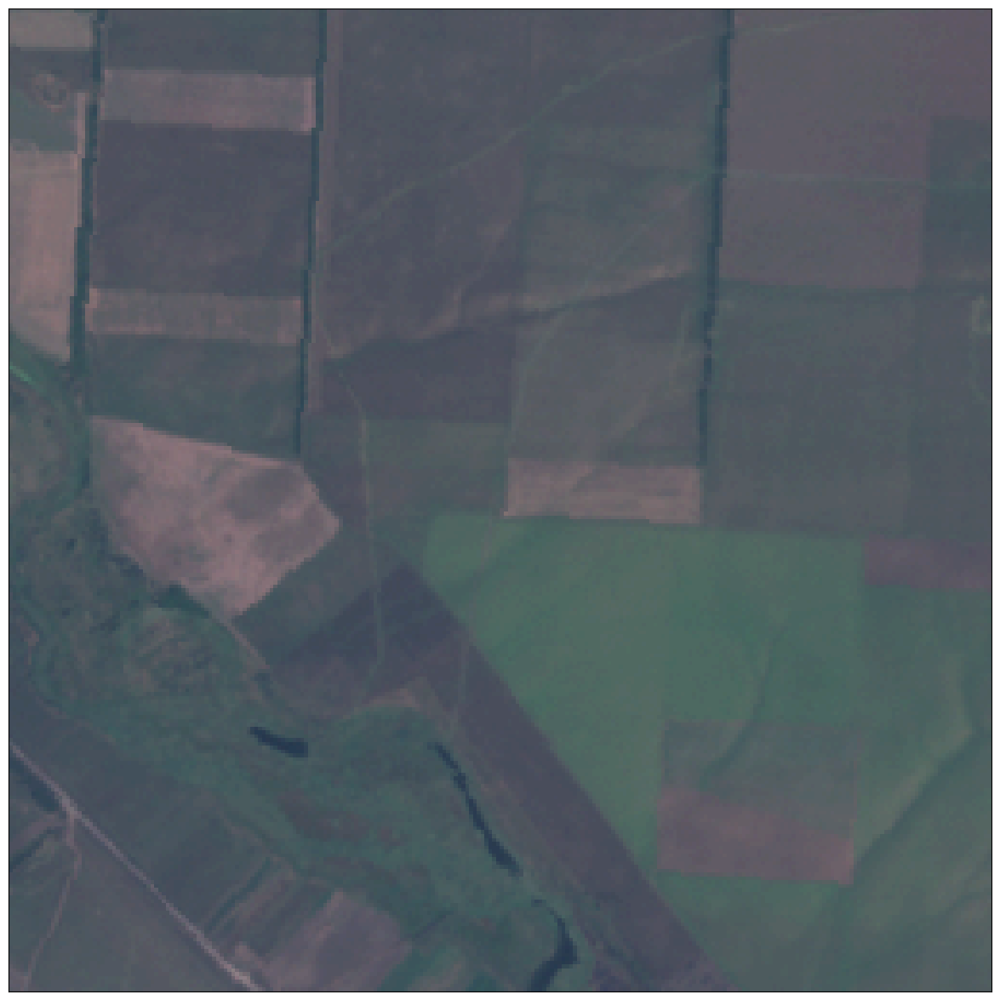

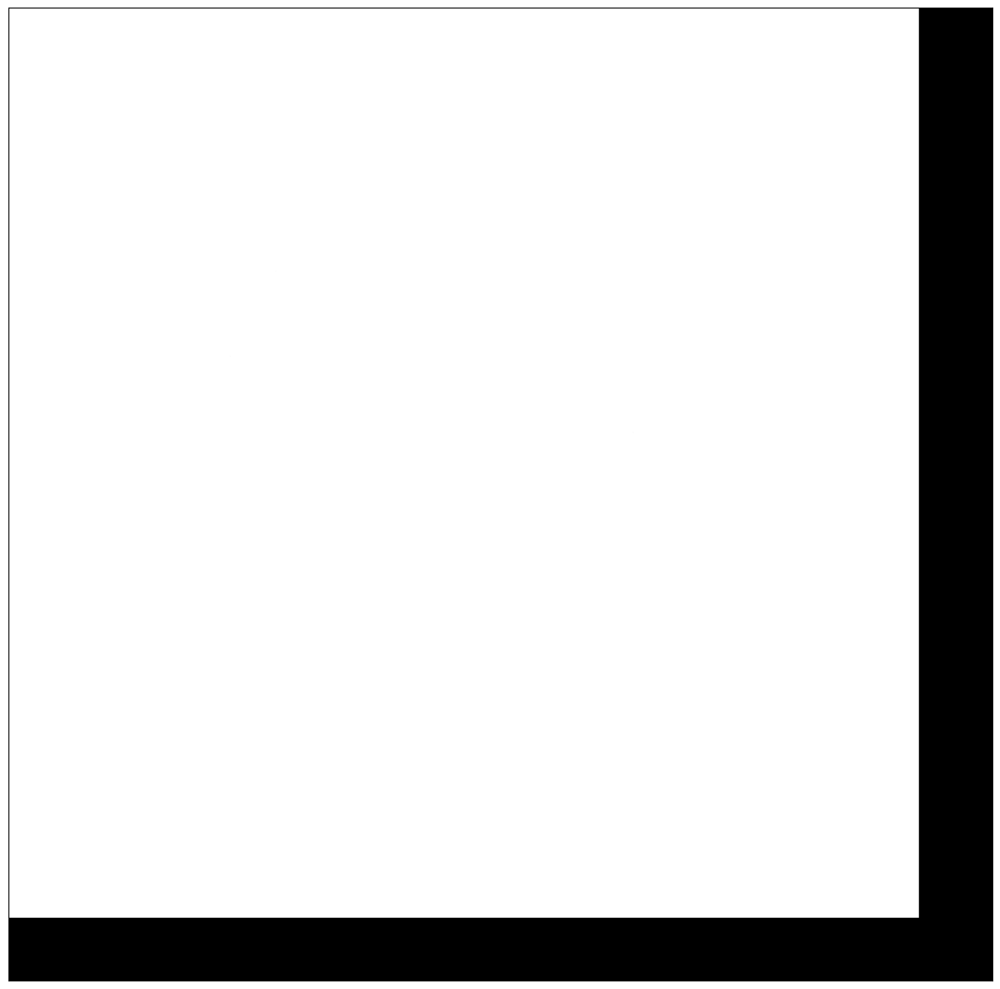

In [83]:
def segment_tile(tile):
    return segment_img(tile, RF, FE)

# Define the step size for sliding the window
step_x = tile_size[1] - overlap
step_y = tile_size[0] - overlap

# Iterate through the image using tiles
for y in range(0, large_image.shape[1], tile_size[0]):
    for x in range(0, large_image.shape[1], tile_size[1]):
        tile = large_image[y:y+tile_size[0], x:x+tile_size[1]]
        if tile.shape[0] == tile_size[0] and tile.shape[1] == tile_size[1]:
            tile = cv2.resize(tile, (SIZE, SIZE))
            tile = cv2.cvtColor(tile, cv2.COLOR_RGB2BGR)
    
            segmented_tile = segment_tile(tile)
            tile_height, tile_width, _ = segmented_tile.shape
    
            # Paste the segmented tile into the segmentation map
            segmentation_map[y:y+tile_height, x:x+tile_width] = segmented_tile

# Save or display the final segmentation map
cv2.imwrite('segmentation_map.jpg', segmentation_map)
plot_image(segmentation_map, factor=3.5 / 255, clip_range=(0, 1))